In [1]:
# This allows Jupyter code cells to produce multiple outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# In-Line Image Transformations for Imbalanced, Multiclass Computer Vision Classification of Lung Chest X-Rays 

## Alexandrea K. Ramnarine

## Introduction

The following is a computer vision study using lung chest x-ray data to assess the impact of multiclass classification based on imbalanced transformed image datasets. Data were transformed to 1. correct for class imbalance and 2. enhance edge features.

**DISCLAIMER** This study does not make any clinical observations or recommendations for any diseases, especially those mentioned in the study related to lung disease pathology. Research conducted is for artificial intelligence computer vision and makes no claims in regards to medicine, biology, health, or any related discipline of the aforementioned. There is no diagnostic or clinical value in this study.

## Resources

In [265]:
# imports required
import time
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mtp
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure, imshow
import matplotlib.pylab as plot
import sys
import os
import glob
from shutil import copy
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
import kerastuner as kt
from tensorflow import keras
from tensorflow.keras import layers, models
from kerastuner.tuners import Hyperband
from numpy import asarray, save, load
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import PIL
from PIL import Image, ImageFilter
import IPython

In [3]:
# The Python version - using tensorflow conda environment
print(sys.version_info)

sys.version_info(major=3, minor=7, micro=9, releaselevel='final', serial=0)


### The Data

**Sources:**

* COVID-19 Image Data Collection: Prospective Predictions Are the Future. Joseph Paul Cohen and Paul Morrison and Lan Dao and Karsten Roth and Tim Q Duong and Marzyeh Ghassemi. arXiv:2006.11988, https://github.com/ieee8023/covid-chestxray-dataset, 2020
* Kermany, D. S., Goldbaum, M., Cai, W., Valentim, C. C., Liang, H., Baxter, S. L., … Zhang, K. (2018). Identifying Medical Diagnoses and Treatable Diseases by Image-Based Deep Learning. Cell, 172(5). https://doi.org/10.1016/j.cell.2018.02.010 
* https://github.com/agchung

Downloaded from https://www.kaggle.com/prashant268/chest-xray-covid19-pneumonia

**Target:**

* *0* - No disease diagnosis
* *1* - COVID-19 diagnosis
* *2* - Non-COVID Pneumonia diagnosis

**Predictors:**

* *images* - Lung chest x-rays

# Data ETL

In [157]:
# just checking on what the cwd is...
os.getcwd()

'C:\\Users\\alxra\\Documents\\test'

In [158]:
# change directory to training data location
os.chdir('C:\\Users\\alxra\\Documents\\train')
os.getcwd()

'C:\\Users\\alxra\\Documents\\train'

In [159]:
os.chdir(os.getcwd()) #local storage

myImgs = []      # Where the np arrays of the image data will be
imgLabels = []    # where the labels for the images will be

for filNam in glob.glob('*.jpg'):
    
    theLabel=0
    if filNam.startswith('COVID'):
        theLabel=1
    elif filNam.startswith('PNEUMONIA'):
        theLabel=2
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    myImgs.append(Img)
    imgLabels.append(theLabel)

#  Array conversions

myImgs=asarray(myImgs)
imgLabels=asarray(imgLabels)

In [160]:
# save numpy arrays
os.mkdir('imgArrayData')

os.chdir('./imgArrayData')

save('myImgs.npy',myImgs)
save('imLabels.npy',imgLabels)

In [161]:
# read and check on arrays
imgArray=load('myImgs.npy')
labelArray=load('imLabels.npy')

imgArray.shape
labelArray.shape

(7790, 100, 100, 3)

(7790,)

## Repeat reading in test dataset

In [162]:
os.getcwd()

'C:\\Users\\alxra\\Documents\\train\\imgArrayData'

In [163]:
# change directory to test data location
os.chdir('C:\\Users\\alxra\\Documents\\test')
os.getcwd()

'C:\\Users\\alxra\\Documents\\test'

In [164]:
os.chdir(os.getcwd()) #local storage

testImgs = []      # Where the np arrays of the image data will be
testLabels = []    # where the labels for the images will be

for filNam in glob.glob('*.jpg'):
    
    theLabel=0
    if filNam.startswith('COVID'):
        theLabel=1
    elif filNam.startswith('PNEUMONIA'):
        theLabel=2
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    testImgs.append(Img)
    testLabels.append(theLabel)

#  Array conversions

testImgs=asarray(testImgs)
testLabels=asarray(testLabels)

In [165]:
testImgs.shape
testLabels.shape

(1953, 100, 100, 3)

(1953,)

# Descriptive Statistics

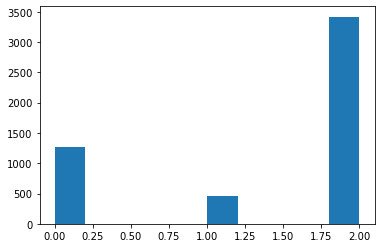

In [14]:
#training label distribution
plt.hist(imgLabels);

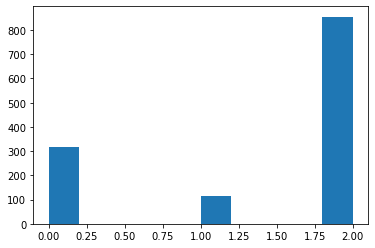

In [15]:
#test label distribution
plt.hist(testLabels);

To handle data imbalance, all training and test class=0 (NORMAL) photos were rotated 180 degrees in Windows Picture Tools and added to respective directories.

All training and test class=1 (COVID-19) photos were rotated 90 degrees to the left, then original images were rotated 90 degrees to the right, then original images were rotated 180 degrees in Windows Picture Tools and added to directories.

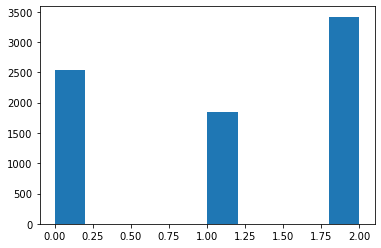

In [166]:
#updated training label distribution
plt.hist(imgLabels);

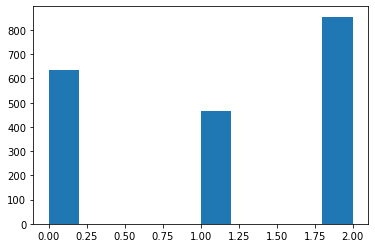

In [167]:
#updated label distribution
plt.hist(testLabels);

# Descriptive Images

In [295]:
random.seed(47)
x = random.sample(range(len(testImgs)), 5)
x

[720, 128, 881, 1133, 929]

In [310]:
for i in x:
    print(imgLabels[i])
    print(testLabels[i])

1
0
1
1
1
0
1
2
1
0


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

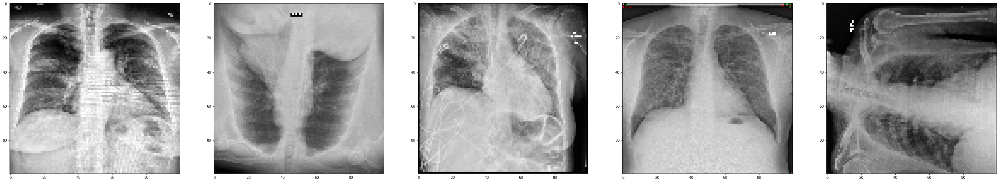

In [296]:
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(imgArray[x[0]]);
ax[1].imshow(imgArray[x[1]]);
ax[2].imshow(imgArray[x[2]]);
ax[3].imshow(imgArray[x[3]]);
ax[4].imshow(imgArray[x[4]]);
plt.show()

# Transform Images

## Using PIL Image Filters

### Training data

In [210]:
# change directory to training data location
os.chdir('C:\\Users\\alxra\\Documents\\train')
os.getcwd()

'C:\\Users\\alxra\\Documents\\train'

In [211]:
#CONTOUR training
contour = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.CONTOUR)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    contour.append(Img)

#  Array conversions
contour=asarray(contour)

In [212]:
#EDGE_ENHANCE_MORE training
edgemore = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.EDGE_ENHANCE_MORE)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    edgemore.append(Img)

#  Array conversions
edgemore=asarray(edgemore)

In [213]:
#FIND_EDGES training
findedge = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.FIND_EDGES)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    findedge.append(Img)

#  Array conversions
findedge=asarray(findedge)

In [214]:
#SHARPEN training
sharpen = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.SHARPEN)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    sharpen.append(Img)

#  Array conversions
sharpen=asarray(sharpen)

### Repeat for test data

In [215]:
# change directory to test data location
os.chdir('C:\\Users\\alxra\\Documents\\test')
os.getcwd()

'C:\\Users\\alxra\\Documents\\test'

In [216]:
#CONTOUR test
contourtest = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.CONTOUR)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    contourtest.append(Img)

#  Array conversions
contourtest=asarray(contourtest)

In [217]:
#EDGE_ENHANCE_MORE test
edgemoretest = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.EDGE_ENHANCE_MORE)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    edgemoretest.append(Img)

#  Array conversions
edgemoretest=asarray(edgemoretest)

In [218]:
#FIND_EDGES test
findedgetest = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.FIND_EDGES)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    findedgetest.append(Img)

#  Array conversions
findedgetest=asarray(findedgetest)

In [219]:
#SHARPEN test
sharpentest = []      # Where the np arrays of the image data will be

for filNam in glob.glob('*.jpg'):
    Img=load_img(filNam, target_size=(100,100))  # you can adjust the size, here.
    Img=Img.filter(ImageFilter.SHARPEN)
    Img=img_to_array(Img) # convert to array
    Img=np.divide(Img,255.)  #default dtype should be float32
    sharpentest.append(Img)

#  Array conversions
sharpentest=asarray(sharpentest)

### Visualize subset of training data

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

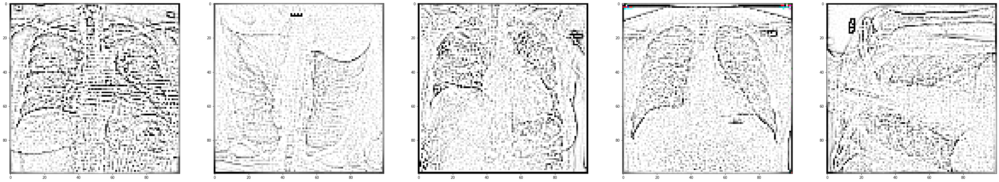

In [294]:
# visualize contoured training images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(contour[x[0]]);
ax[1].imshow(contour[x[1]]);
ax[2].imshow(contour[x[2]]);
ax[3].imshow(contour[x[3]]);
ax[4].imshow(contour[x[4]]);
plt.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

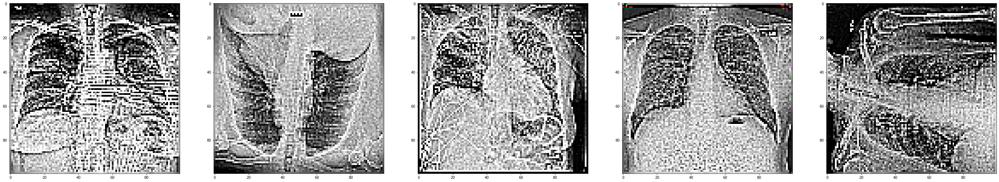

In [297]:
# visualize enhance edges more training images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(edgemore[x[0]]);
ax[1].imshow(edgemore[x[1]]);
ax[2].imshow(edgemore[x[2]]);
ax[3].imshow(edgemore[x[3]]);
ax[4].imshow(edgemore[x[4]]);
plt.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

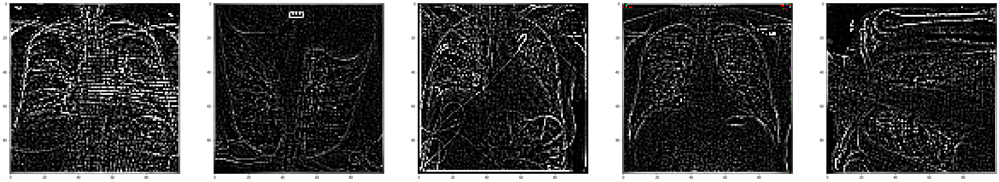

In [298]:
# visualize find_edges training images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(findedge[x[0]]);
ax[1].imshow(findedge[x[1]]);
ax[2].imshow(findedge[x[2]]);
ax[3].imshow(findedge[x[3]]);
ax[4].imshow(findedge[x[4]]);
plt.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

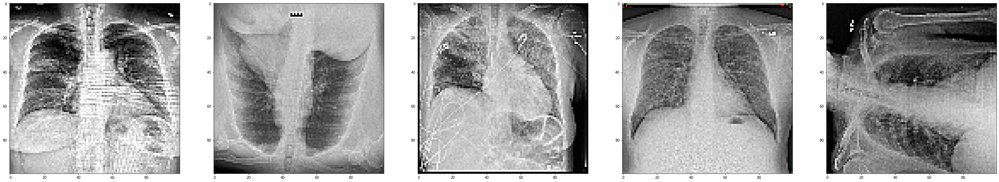

In [299]:
# visualize sharpened training images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(sharpen[x[0]]);
ax[1].imshow(sharpen[x[1]]);
ax[2].imshow(sharpen[x[2]]);
ax[3].imshow(sharpen[x[3]]);
ax[4].imshow(sharpen[x[4]]);
plt.show()

### Visualize subset of test data

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

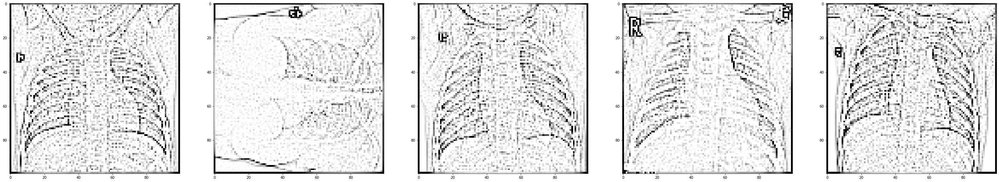

In [300]:
# visualize contoured test images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(contourtest[x[0]]);
ax[1].imshow(contourtest[x[1]]);
ax[2].imshow(contourtest[x[2]]);
ax[3].imshow(contourtest[x[3]]);
ax[4].imshow(contourtest[x[4]]);
plt.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

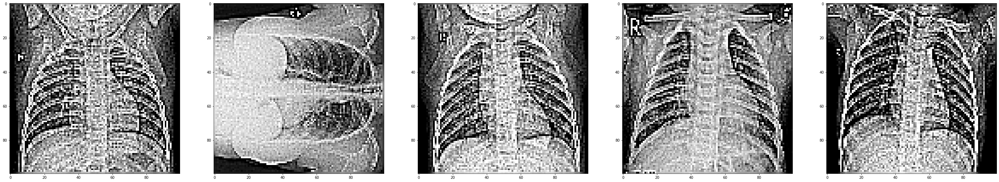

In [301]:
# visualize enhance edges more training images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(edgemoretest[x[0]]);
ax[1].imshow(edgemoretest[x[1]]);
ax[2].imshow(edgemoretest[x[2]]);
ax[3].imshow(edgemoretest[x[3]]);
ax[4].imshow(edgemoretest[x[4]]);
plt.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

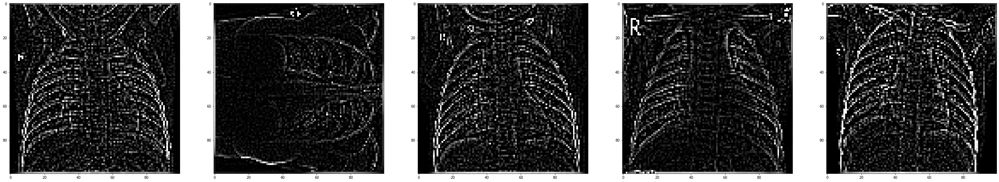

In [302]:
# visualize find_edges test images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(findedgetest[x[0]]);
ax[1].imshow(findedgetest[x[1]]);
ax[2].imshow(findedgetest[x[2]]);
ax[3].imshow(findedgetest[x[3]]);
ax[4].imshow(findedgetest[x[4]]);
plt.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

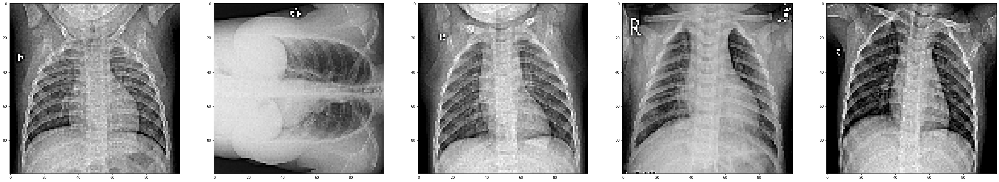

In [303]:
# visualize sharpened test images
plt.figure();
f, ax = plt.subplots(1,5,figsize = (50,50))

ax[0].imshow(sharpentest[x[0]]);
ax[1].imshow(sharpentest[x[1]]);
ax[2].imshow(sharpentest[x[2]]);
ax[3].imshow(sharpentest[x[3]]);
ax[4].imshow(sharpentest[x[4]]);
plt.show()

# Neural Network

Image arrays to train on:

* **original** - imgArray
* **contoured** - contour
* **more enhanced edges** - edgemore
* **found edges** - findedge
* **sharpened** - sharpen

To test on:

* **original** - testImgs
* **contoured** - contourtest
* **more enhanced edges** - edgemoretest
* **found edges** - findedgetest
* **sharpened** - sharpentest


Label arrays:

* **imgLabels** - should work for all training arrays
* **testLabels** - should work for all test arrays

## Implement keras tuner for the first model using original untransformed data, then save hyperparameters choosen to run remaining transformed datasets

In [195]:
imgArray.shape

(7790, 100, 100, 3)

In [196]:
#define model for hyperparameter optimization
def model_builder(hp):
    model1 = keras.Sequential()
    # Tune the number of filters and units for an optimal value between 32-512
    hp_filters = hp.Int('filters', min_value = 32, max_value = 256, step = 32)
    hp_units = hp.Int('units', min_value = 32, max_value = 256, step = 32)
    # Tune Conv2D kernel size
    hp_kernel = hp.Choice('kernel_size', values = [2, 3, 5])
    model1.add(keras.layers.Conv2D(filters = hp_filters, kernel_size = hp_kernel, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)))
    model1.add(keras.layers.MaxPool2D(2,2))
    model1.add(keras.layers.Conv2D(filters = hp_filters, kernel_size = hp_kernel, activation='relu', kernel_initializer='he_uniform'))
    model1.add(keras.layers.MaxPool2D(2,2))
    model1.add(keras.layers.Flatten())
    model1.add(keras.layers.Dense(units = hp_units, activation='relu'))
    model1.add(keras.layers.Dense(3, activation='softmax'))
    # Tune the learning rate for the optimizer 
    # Choose an optimal value from 0.01, 0.001, or 0.0001
    hp_learning_rate = hp.Choice('learning_rate', values = [1e-2, 1e-3, 1e-4]) 
    model1.compile(optimizer = keras.optimizers.Adam(learning_rate = hp_learning_rate),loss = keras.losses.SparseCategoricalCrossentropy(from_logits = True), metrics = ['accuracy'])
    return model1

In [200]:
#set up Hyperband tuner
tuner = kt.Hyperband(model_builder, objective='val_accuracy', max_epochs=15, factor=3)

class ClearTrainingOutput(tf.keras.callbacks.Callback):
    def on_train_end(*args, **kwargs):
        IPython.display.clear_output(wait = True)

INFO:tensorflow:Reloading Oracle from existing project .\untitled_project\oracle.json
INFO:tensorflow:Reloading Tuner from .\untitled_project\tuner0.json


In [201]:
tuner.search(imgArray, imgLabels, epochs=15, validation_split=0.3, shuffle=True, callbacks=[ClearTrainingOutput()])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

INFO:tensorflow:Oracle triggered exit


In [202]:
#get optimal hyperparameters using original dataset
best_hps.get('units')
best_hps.get('filters')
best_hps.get('kernel_size')
best_hps.get('learning_rate')

160

64

5

0.0001

In [203]:
#use best model to train and validate
model1 = tuner.hypermodel.build(best_hps)

In [204]:
start = time.time() # begin training timing
History1 = model1.fit(x=imgArray, y=imgLabels, epochs=15, validation_split=0.3, shuffle=True, verbose=0)
stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 30.160035371780396s


In [205]:
#get original datasets history
History1.history

{'loss': [0.735109147895657,
  0.6066780618499359,
  0.6009080015517759,
  0.5955508244971103,
  0.5847491887475774,
  0.5791112168128614,
  0.5741375315720589,
  0.575557599324776,
  0.5704580826998064,
  0.5701352026885351,
  0.5672429390900642,
  0.5649868552343311,
  0.5654624239602221,
  0.5665835930670202,
  0.5631944072939552],
 'accuracy': [0.81716484,
  0.94846874,
  0.95286995,
  0.957638,
  0.96809095,
  0.9741427,
  0.9787273,
  0.9779938,
  0.98312855,
  0.9836787,
  0.984779,
  0.98789656,
  0.98771316,
  0.9862461,
  0.98918027],
 'val_loss': [0.679164939473519,
  0.7272886751194922,
  0.6161771785718129,
  0.6310698798848463,
  0.7544266821790262,
  0.7521256420364428,
  0.6290886200132357,
  0.6495989595767419,
  0.606892649031726,
  0.6348385461436717,
  0.6127810798040251,
  0.7569348416269259,
  0.6584719461052143,
  0.6067878269057627,
  0.6422630234003374],
 'val_accuracy': [0.877193,
  0.8189987,
  0.93624306,
  0.92255026,
  0.7869063,
  0.7937527,
  0.92083865,

In [206]:
#test set evaluation
M1loss, M1accuracy = model1.evaluate(x=testImgs, y=testLabels, verbose=0)
print('Test set accuracy: ', M1accuracy * 100)
print('Test set loss: ', M1loss)

Test set accuracy:  94.41884160041809
Test set loss:  0.6093475766445634


              precision    recall  f1-score   support

           0       0.89      0.98      0.93       634
           1       0.98      0.97      0.98       464
           2       0.97      0.91      0.94       855

    accuracy                           0.94      1953
   macro avg       0.95      0.95      0.95      1953
weighted avg       0.95      0.94      0.94      1953



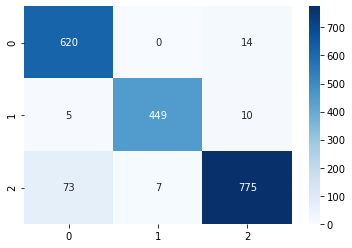

In [207]:
#test predictions for classification and confusion matrix
M1_pred = model1.predict(x=testImgs, verbose=0).argmax(-1)

print(classification_report(testLabels, M1_pred))
sns.heatmap(confusion_matrix(testLabels, M1_pred), annot=True, fmt='d', cmap='Blues');

# Contour Dataset

In [220]:
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)

In [229]:
model2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=160, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model2.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

start = time.time() # begin training timing

History2 = model2.fit(x=contour, y=imgLabels, validation_split=0.3, shuffle=True, epochs=15, verbose=0)

stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 30.196516036987305s


In [230]:
History2.history

{'loss': [0.8115327415795539,
  0.23459998446359737,
  0.1936996063354495,
  0.1504027847492343,
  0.12261752114205454,
  0.10113744876857635,
  0.08277457263230165,
  0.06166213704042537,
  0.04521816334532266,
  0.03610753208568244,
  0.030965513408757226,
  0.018401678711177285,
  0.014102646425009791,
  0.012916451774099655,
  0.008217558515858975],
 'accuracy': [0.7359252,
  0.91821015,
  0.93434805,
  0.9499358,
  0.9603888,
  0.96680725,
  0.9721254,
  0.9849624,
  0.98771316,
  0.991931,
  0.9921144,
  0.99706584,
  0.99798274,
  0.9977994,
  0.9990831],
 'val_loss': [0.4376812818841542,
  1.246358343176496,
  0.28489183439408095,
  0.2002168823054294,
  0.44528502246040563,
  0.3956731924795931,
  0.2122975602087668,
  0.3178847536592512,
  0.28159678211574357,
  0.47044708725982765,
  0.28253852235548643,
  0.3960631799432427,
  0.5836021131486059,
  0.39954627705540935,
  0.47633439329608657],
 'val_accuracy': [0.83996576,
  0.6452717,
  0.8827557,
  0.9135644,
  0.8322636,


In [231]:
#test set evaluation
M2loss, M2accuracy = model2.evaluate(x=contourtest, y=testLabels, verbose=0)
print('Test set accuracy: ', M2accuracy * 100)
print('Test set loss: ', M2loss)

Test set accuracy:  91.80747270584106
Test set loss:  0.33422457122337335


              precision    recall  f1-score   support

           0       0.87      0.93      0.90       634
           1       0.96      0.98      0.97       464
           2       0.94      0.87      0.90       855

    accuracy                           0.92      1953
   macro avg       0.92      0.93      0.92      1953
weighted avg       0.92      0.92      0.92      1953



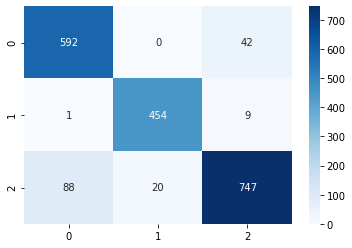

In [232]:
#test predictions for classification and confusion matrix
M2_pred = model2.predict(x=contourtest, verbose=0).argmax(-1)

print(classification_report(testLabels, M2_pred))
sns.heatmap(confusion_matrix(testLabels, M2_pred), annot=True, fmt='d', cmap='Blues');

# More Enhanced Edge Dataset

In [233]:
model3 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=160, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model3.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

start = time.time() # begin training timing

tf.random.set_seed(7)
History3 = model3.fit(x=edgemore, y=imgLabels, validation_split=0.3, shuffle=True, epochs=15, verbose=0)

stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 30.412930727005005s


In [234]:
History3.history

{'loss': [0.4268931757194852,
  0.13203219670577593,
  0.10380544886334586,
  0.0680729768604625,
  0.05320867460221736,
  0.034735763034488346,
  0.03316182071828452,
  0.018578761031445713,
  0.01006178702643647,
  0.009805723932716368,
  0.005153650621592031,
  0.003498446006569024,
  0.0024134617096625093,
  0.0019763726621682028,
  0.0012985583464982246],
 'accuracy': [0.8769485,
  0.95305336,
  0.9653402,
  0.9763433,
  0.9816615,
  0.9913809,
  0.9906474,
  0.99578214,
  0.9987163,
  0.99926645,
  0.9998166,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_loss': [0.3824082790106012,
  0.8033896784561538,
  0.1820851016230164,
  0.09953444137863231,
  0.20738378960031906,
  0.44367144873408004,
  0.2001612201631133,
  0.4015953401545964,
  0.27703354615761167,
  0.2897836114042811,
  0.30854534342802126,
  0.46192676929225385,
  0.4078181204208718,
  0.3361263600930055,
  0.4032301813685628],
 'val_accuracy': [0.8605049,
  0.74326056,
  0.93281984,
  0.96747965,
  0.92468977,
  0.8570817,
  0

In [235]:
#test set evaluation
M3loss, M3accuracy = model3.evaluate(x=edgemoretest, y=testLabels, verbose=0)
print('Test set accuracy: ', M3accuracy * 100)
print('Test set loss: ', M3loss)

Test set accuracy:  93.65079402923584
Test set loss:  0.2639584553955107


              precision    recall  f1-score   support

           0       0.90      0.95      0.92       634
           1       0.97      0.97      0.97       464
           2       0.95      0.91      0.93       855

    accuracy                           0.94      1953
   macro avg       0.94      0.94      0.94      1953
weighted avg       0.94      0.94      0.94      1953



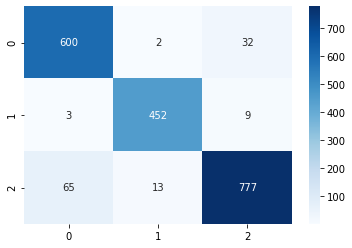

In [236]:
#test predictions for classification and confusion matrix
M3_pred = model3.predict(x=edgemoretest, verbose=0).argmax(-1)

print(classification_report(testLabels, M3_pred))
sns.heatmap(confusion_matrix(testLabels, M3_pred), annot=True, fmt='d', cmap='Blues');

# Find Edge Dataset

In [237]:
model4 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=160, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model4.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

start = time.time() # begin training timing

tf.random.set_seed(7)
History4 = model4.fit(x=findedge, y=imgLabels, validation_split=0.3, shuffle=True, epochs=15, verbose=0)

stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 29.886714935302734s


In [238]:
History4.history

{'loss': [0.4091872490044801,
  0.1389541030394666,
  0.0962551868680025,
  0.061663282953179493,
  0.04050967543934674,
  0.026846375377688702,
  0.019518645130735642,
  0.011034229015663345,
  0.006497308452607332,
  0.004165253720539845,
  0.002987561558142107,
  0.0021399028792939076,
  0.0015704309983663508,
  0.0012351912136975107,
  0.0009411798453094841],
 'accuracy': [0.8760315,
  0.95286995,
  0.96827435,
  0.98056114,
  0.99028057,
  0.995232,
  0.9965157,
  0.9988997,
  0.99963325,
  0.9998166,
  0.9998166,
  1.0,
  1.0,
  1.0,
  1.0],
 'val_loss': [0.4680417829986612,
  0.6968409319909965,
  0.24542199316401486,
  0.3657793370248877,
  0.3160063030917929,
  0.610873620286042,
  0.27330922380736944,
  0.5114775270312885,
  0.4278857019978185,
  0.5908492688200395,
  0.5413378972166039,
  0.5739537168518952,
  0.6867640170782396,
  0.5959439066118749,
  0.5596837089377088],
 'val_accuracy': [0.81557554,
  0.7629439,
  0.9101412,
  0.8737698,
  0.8951647,
  0.8202824,
  0.912

In [239]:
#test set evaluation
M4loss, M4accuracy = model4.evaluate(x=findedgetest, y=testLabels, verbose=0)
print('Test set accuracy: ', M4accuracy * 100)
print('Test set loss: ', M4loss)

Test set accuracy:  92.1658992767334
Test set loss:  0.32148920098690276


              precision    recall  f1-score   support

           0       0.86      0.95      0.91       634
           1       0.97      0.96      0.96       464
           2       0.95      0.88      0.91       855

    accuracy                           0.92      1953
   macro avg       0.93      0.93      0.93      1953
weighted avg       0.92      0.92      0.92      1953



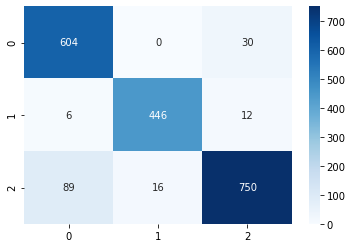

In [240]:
# test predictions for classification and confusion matrix
M4_pred = model4.predict(x=findedgetest, verbose=0).argmax(-1)

print(classification_report(testLabels, M4_pred))
sns.heatmap(confusion_matrix(testLabels, M4_pred), annot=True, fmt='d', cmap='Blues');

# Sharpen Dataset

In [241]:
model5 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=160, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model5.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

start = time.time() # begin training timing

tf.random.set_seed(7)
History5 = model5.fit(x=sharpen, y=imgLabels, validation_split=0.3, shuffle=True, epochs=15, verbose=0)

stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 30.96768593788147s


In [242]:
History5.history

{'loss': [0.48961368855857507,
  0.11564067634894785,
  0.08842000583096739,
  0.06220612336409905,
  0.04864686191923658,
  0.043352530071265584,
  0.03136522077968371,
  0.022746817079537858,
  0.016398192608280508,
  0.01453757683502115,
  0.011756493638847048,
  0.007516629646751106,
  0.004839533441760672,
  0.0037031517064218663,
  0.0028036805456864594],
 'accuracy': [0.8738309,
  0.957638,
  0.97175866,
  0.9778104,
  0.98294514,
  0.98569596,
  0.989547,
  0.99449843,
  0.9965157,
  0.99688244,
  0.99706584,
  0.9990831,
  1.0,
  0.9998166,
  1.0],
 'val_loss': [0.3690693620265576,
  0.4942798928816348,
  0.1954709148950234,
  0.11257942218873865,
  0.17619505540256986,
  0.41833895360066636,
  0.25394293967479814,
  0.43947939385983187,
  0.20363057495936093,
  0.32952361842589495,
  0.40813259654158346,
  0.3994851161494284,
  0.3880784833739214,
  0.3440737808820627,
  0.3193441452725504],
 'val_accuracy': [0.86435604,
  0.826273,
  0.9259735,
  0.95849377,
  0.93881047,
  

In [243]:
#test set evaluation
M5loss, M5accuracy = model5.evaluate(x=sharpentest, y=testLabels, verbose=0)
print('Test set accuracy: ', M5accuracy * 100)
print('Test set loss: ', M5loss)

Test set accuracy:  94.2140281200409
Test set loss:  0.2354768348583024


              precision    recall  f1-score   support

           0       0.92      0.95      0.93       634
           1       0.97      0.97      0.97       464
           2       0.95      0.92      0.93       855

    accuracy                           0.94      1953
   macro avg       0.94      0.95      0.95      1953
weighted avg       0.94      0.94      0.94      1953



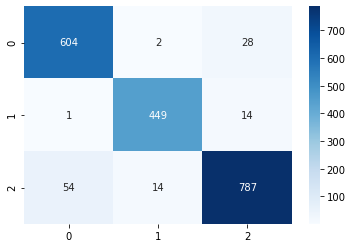

In [245]:
# test predictions for classification and confusion matrix
M5_pred = model5.predict(x=sharpentest, verbose=0).argmax(-1)

print(classification_report(testLabels, M5_pred))
sns.heatmap(confusion_matrix(testLabels, M5_pred), annot=True, fmt='d', cmap='Blues');

# 20% Dropout to model with best performing dataset

Best performing model used dataset for best testset accuracy. Sharpen and original datasets both had ~94% test accuracy, but Sharpen test loss was 0.235 while Original test loss was 0.609. Sharpen dataset is used to evaluate dropout.

In [246]:
model6 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=160, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model6.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

start = time.time() # begin training timing

tf.random.set_seed(7)
History6 = model6.fit(x=sharpen, y=imgLabels, validation_split=0.3, shuffle=True, epochs=15, verbose=0)

stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 32.25246739387512s


In [247]:
History6.history

{'loss': [0.8661792892945616,
  0.1643648501693951,
  0.13775454998950926,
  0.10762543190703104,
  0.09838890667008016,
  0.08178877474472604,
  0.07483133066420995,
  0.0657046005927749,
  0.058570584989694766,
  0.05568082838794211,
  0.04734589374428979,
  0.046158820567299044,
  0.0423433837960253,
  0.03519922892455276,
  0.029877397422189454],
 'accuracy': [0.83018523,
  0.94058317,
  0.94975245,
  0.96112233,
  0.96460664,
  0.97175866,
  0.9734091,
  0.9767101,
  0.97836053,
  0.980011,
  0.98294514,
  0.98331195,
  0.98569596,
  0.9893637,
  0.98918027],
 'val_loss': [0.4733303588682329,
  0.5407755221752311,
  0.3105938869775948,
  0.25166275904099045,
  0.37586124521266917,
  0.4520752584776105,
  0.30710044030736133,
  0.3818578950400836,
  0.30664587877834254,
  0.36355702684228625,
  0.31432188549355966,
  0.2684815676104171,
  0.5125487741365053,
  0.2685891302110397,
  0.3061151913230522],
 'val_accuracy': [0.8344031,
  0.7826273,
  0.88403934,
  0.9127086,
  0.8549422

In [248]:
#test set evaluation
M6loss, M6accuracy = model6.evaluate(x=sharpentest, y=testLabels, verbose=0)
print('Test set accuracy: ', M6accuracy * 100)
print('Test set loss: ', M6loss)

Test set accuracy:  92.31950640678406
Test set loss:  0.2213855926998921


              precision    recall  f1-score   support

           0       0.85      0.97      0.91       634
           1       0.99      0.92      0.95       464
           2       0.95      0.89      0.92       855

    accuracy                           0.92      1953
   macro avg       0.93      0.93      0.93      1953
weighted avg       0.93      0.92      0.92      1953



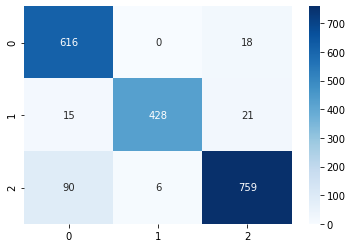

In [249]:
# test predictions for classification and confusion matrix
M6_pred = model6.predict(x=sharpentest, verbose=0).argmax(-1)

print(classification_report(testLabels, M6_pred))
sns.heatmap(confusion_matrix(testLabels, M6_pred), annot=True, fmt='d', cmap='Blues');

# 50% Dropout  to model with best performing dataset

In [250]:
model7 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform', input_shape=(100,100,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation='relu', kernel_initializer='he_uniform'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=160, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model7.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

start = time.time() # begin training timing

tf.random.set_seed(7)
History7 = model7.fit(x=sharpen, y=imgLabels, validation_split=0.3, shuffle=True, epochs=15, verbose=0)

stop = time.time() # end training timing
print(f"Training time: {stop - start}s") # print total train time

Training time: 33.08478808403015s


In [251]:
History7.history

{'loss': [0.790798214024936,
  0.22954483833809566,
  0.19387438220812075,
  0.1696371453922319,
  0.1628266900160237,
  0.1428920006109294,
  0.13601253025319823,
  0.12433460929482087,
  0.11393853328478526,
  0.09980193038593842,
  0.09493497007897245,
  0.08836174555575106,
  0.08248418298622194,
  0.07685331709296271,
  0.07024923243740765],
 'accuracy': [0.77480286,
  0.91857696,
  0.92976344,
  0.9378324,
  0.9427838,
  0.95085275,
  0.95048594,
  0.9589217,
  0.9572712,
  0.96332294,
  0.96479005,
  0.97029155,
  0.9697414,
  0.9741427,
  0.9756098],
 'val_loss': [0.4538083770844382,
  0.45300826753593687,
  0.3503364566163625,
  0.3154573070286276,
  0.4041882967484727,
  0.5232854929358519,
  0.26471054121679766,
  0.41706800888657924,
  0.3104492249935674,
  0.39554920688647716,
  0.36577748439992447,
  0.27859733873802117,
  0.42622021726935555,
  0.3261378835703401,
  0.2822485017595405],
 'val_accuracy': [0.8801883,
  0.8438169,
  0.8913137,
  0.9045785,
  0.86221653,
  0

In [252]:
#test set evaluation
M7loss, M7accuracy = model7.evaluate(x=sharpentest, y=testLabels, verbose=0)
print('Test set accuracy: ', M7accuracy * 100)
print('Test set loss: ', M7loss)

Test set accuracy:  91.8586790561676
Test set loss:  0.22645110193772564


              precision    recall  f1-score   support

           0       0.84      0.98      0.90       634
           1       0.99      0.91      0.94       464
           2       0.96      0.88      0.92       855

    accuracy                           0.92      1953
   macro avg       0.93      0.92      0.92      1953
weighted avg       0.93      0.92      0.92      1953



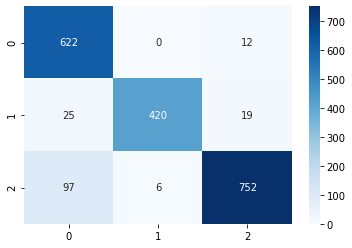

In [253]:
# test predictions for classification and confusion matrix
M7_pred = model7.predict(x=sharpentest, verbose=0).argmax(-1)

print(classification_report(testLabels, M7_pred))
sns.heatmap(confusion_matrix(testLabels, M7_pred), annot=True, fmt='d', cmap='Blues');

# Generate Model Summaries and Save Models for Future Use

In [257]:
#Model 1 - Trained on Original Dataset

model1.summary()

model1.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model1_originaldataset') 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 30976)             0         
_________________________________________________________________
dense (Dense)                (None, 160)               4956320   
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 4

In [258]:
#Model 2 - Trained on Contoured Dataset

model2.summary()

model2.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model2_originaldataset') 

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 30976)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 160)               4956320   
_________________________________________________________________
dense_7 (Dense)              (None, 3)                

In [259]:
#Model 3 - Trained on MORE_EDGE_ENHANCE Dataset

model3.summary()

model3.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model3_edgeenhanceddataset') 

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 30976)             0         
_________________________________________________________________
dense_8 (Dense)              (None, 160)               4956320   
_________________________________________________________________
dense_9 (Dense)              (None, 3)                

In [260]:
#Model 4 - Trained on FIND_EDGE Dataset

model4.summary()

model4.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model4_foundedgedataset') 

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 22, 22, 64)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 30976)             0         
_________________________________________________________________
dense_10 (Dense)             (None, 160)               4956320   
_________________________________________________________________
dense_11 (Dense)             (None, 3)                

In [261]:
#Model 5 - Trained on Sharpen Dataset

model5.summary()

model5.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model5_sharpendataset') 

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 22, 22, 64)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 30976)             0         
_________________________________________________________________
dense_12 (Dense)             (None, 160)               4956320   
_________________________________________________________________
dense_13 (Dense)             (None, 3)                

In [262]:
#Model 4 - Trained on Sharpen Dataset with 20% Dropout Regularization

model6.summary()

model6.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model6_sharpendataset_20dropout') 

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 48, 48, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 22, 22, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 22, 22, 64)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 30976)            

In [263]:
#Model 7 - Trained on Sharpen Dataset with 50% Dropout Regularization

model7.summary()

model7.save('C:\\Users\\alxra\\Documents\\chestxray_saved_models\\model7_sharpendataset_50dropout') 

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 96, 96, 64)        4864      
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 48, 48, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 44, 44, 64)        102464    
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 22, 22, 64)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 22, 22, 64)        0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 30976)            

# Layer Extractions

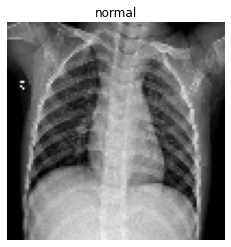

In [256]:
j = x[4]
class_names = ['normal', 'COVID19', 'Pneumonia']

imge = testImgs[j]
img_tensor = np.expand_dims(imge, axis=0)

plt.imshow(imge);
plt.axis('off');
plt.title(class_names[testLabels[j]], fontsize=12);
plt.show();

## Original Model - Conv & Maxpooling Layer Filters

In [266]:
# Extracts the outputs of the all the layers
M1layer_outputs = [layer.output for layer in model1.layers]
# Creates a model that will return these outputs, given the model input:
M1activation_model = models.Model(inputs=model1.input, outputs=M1layer_outputs)

M1layer_names = []
for layer in model1.layers:
    M1layer_names.append(layer.name)
    
M1layer_names

['conv2d',
 'max_pooling2d',
 'conv2d_1',
 'max_pooling2d_1',
 'flatten',
 'dense',
 'dense_1']

In [267]:
activations = M1activation_model.predict(img_tensor)
len(activations)

7

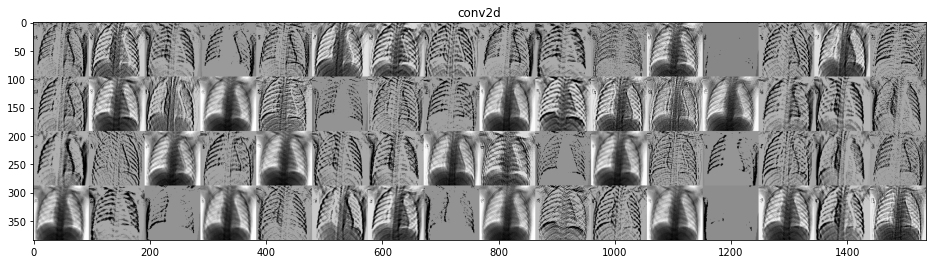

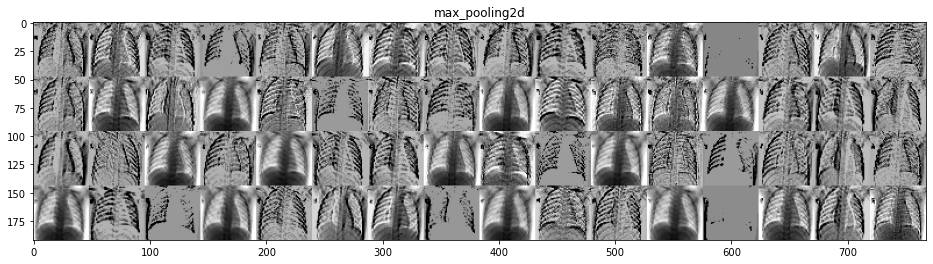

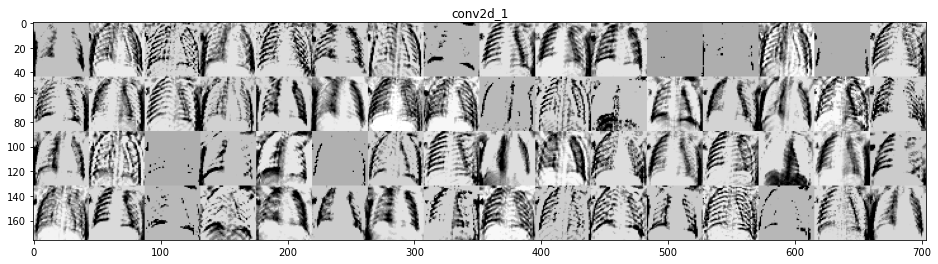

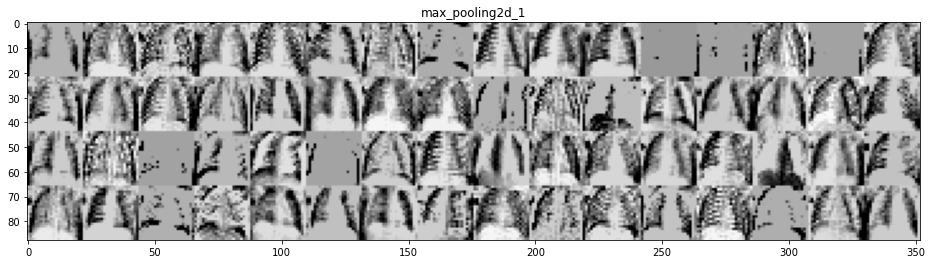

In [268]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model1.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();

## Contour Model - Conv & Maxpooling Layer Filters

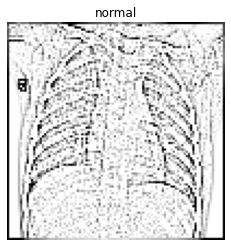

In [269]:
imge = contourtest[j]
img_tensor = np.expand_dims(imge, axis=0)

plt.imshow(imge);
plt.axis('off');
plt.title(class_names[testLabels[j]], fontsize=12);
plt.show();

In [270]:
# Extracts the outputs of the all the layers
M2layer_outputs = [layer.output for layer in model2.layers]
# Creates a model that will return these outputs, given the model input:
M2activation_model = models.Model(inputs=model2.input, outputs=M2layer_outputs)

M2layer_names = []
for layer in model2.layers:
    M2layer_names.append(layer.name)
    
M2layer_names

['conv2d_6',
 'max_pooling2d_6',
 'conv2d_7',
 'max_pooling2d_7',
 'flatten_3',
 'dense_6',
 'dense_7']

In [271]:
activations = M2activation_model.predict(img_tensor)
len(activations)

7

C:\Users\alxra\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


MemoryError: Unable to allocate 216. TiB for an array with shape (59969536, 495616) and data type float64

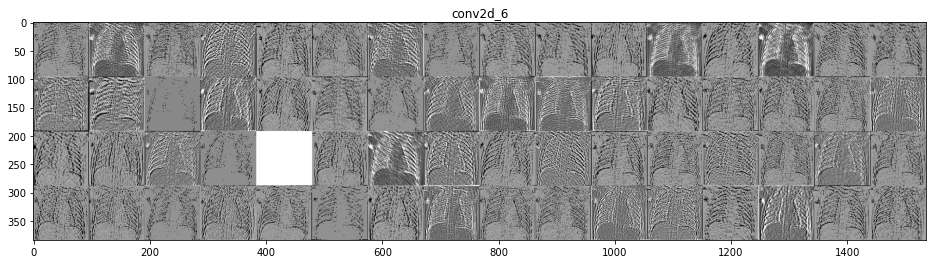

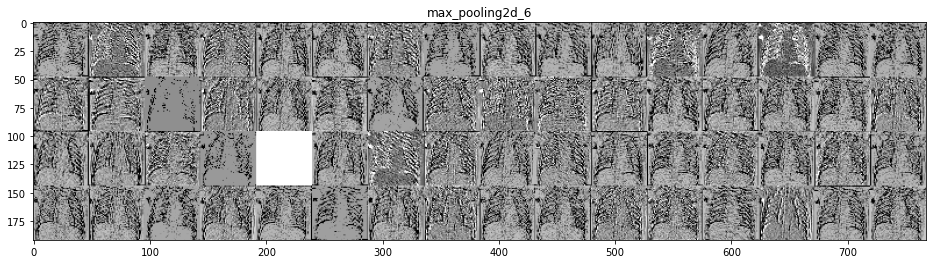

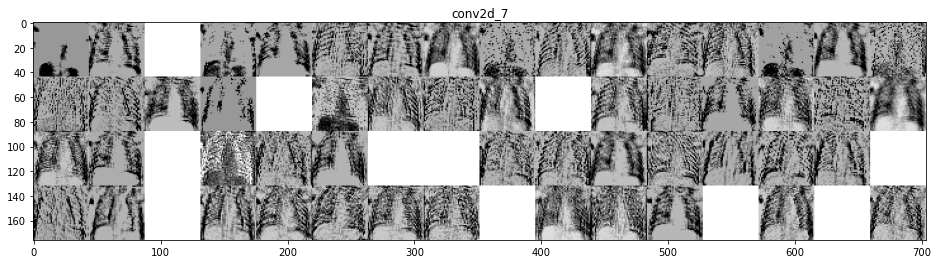

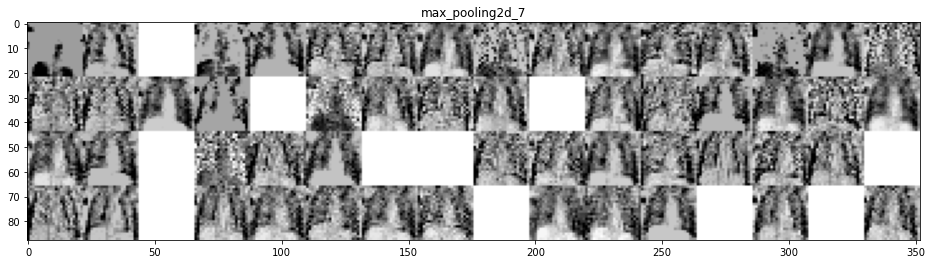

In [272]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model2.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();

## More Enhanced Edge Model - Conv & Maxpooling Layer Filters

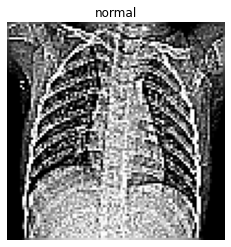

In [275]:
imge = edgemoretest[j]
img_tensor = np.expand_dims(imge, axis=0)

plt.imshow(imge);
plt.axis('off');
plt.title(class_names[testLabels[j]], fontsize=12);
plt.show();

In [276]:
# Extracts the outputs of the all the layers
M3layer_outputs = [layer.output for layer in model3.layers]
# Creates a model that will return these outputs, given the model input:
M3activation_model = models.Model(inputs=model3.input, outputs=M3layer_outputs)

M3layer_names = []
for layer in model3.layers:
    M3layer_names.append(layer.name)
    
M3layer_names

['conv2d_8',
 'max_pooling2d_8',
 'conv2d_9',
 'max_pooling2d_9',
 'flatten_4',
 'dense_8',
 'dense_9']

In [277]:
activations = M3activation_model.predict(img_tensor)
len(activations)

7

C:\Users\alxra\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


MemoryError: Unable to allocate 216. TiB for an array with shape (59969536, 495616) and data type float64

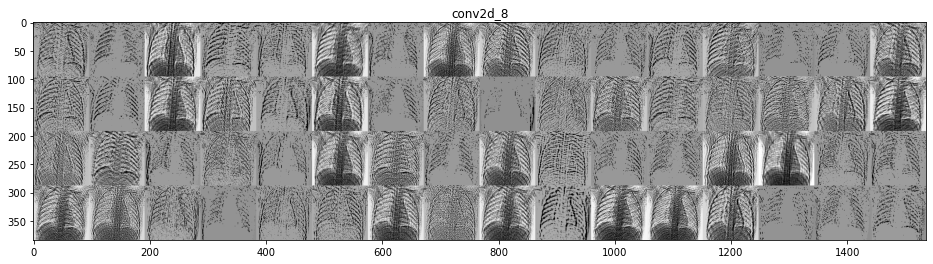

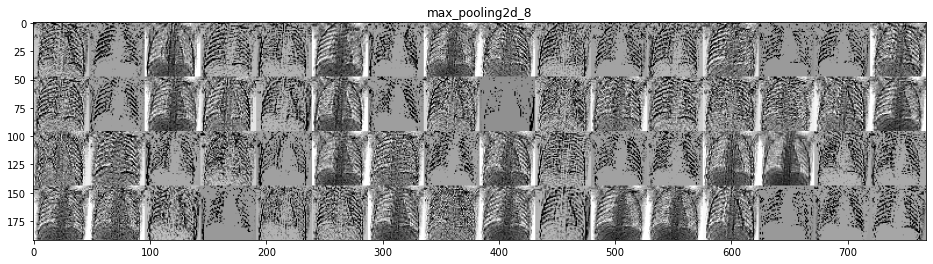

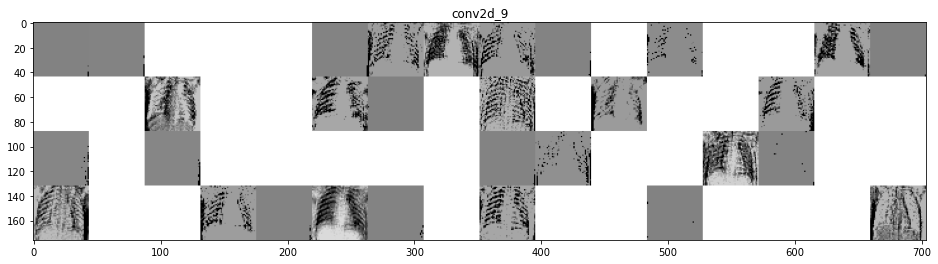

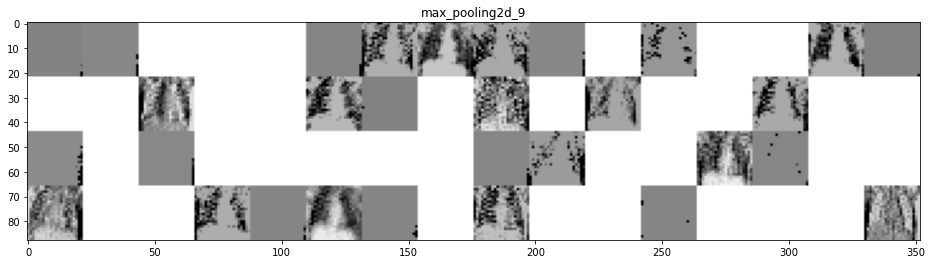

In [278]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model3.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();

## Find Edge Model - Conv & Maxpooling Layer Filters

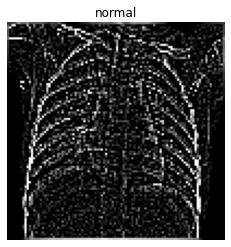

In [279]:
imge = findedgetest[j]
img_tensor = np.expand_dims(imge, axis=0)

plt.imshow(imge);
plt.axis('off');
plt.title(class_names[testLabels[j]], fontsize=12);
plt.show();

In [280]:
# Extracts the outputs of the all the layers
M4layer_outputs = [layer.output for layer in model4.layers]
# Creates a model that will return these outputs, given the model input:
M4activation_model = models.Model(inputs=model4.input, outputs=M4layer_outputs)

M4layer_names = []
for layer in model4.layers:
    M4layer_names.append(layer.name)
    
M4layer_names

['conv2d_10',
 'max_pooling2d_10',
 'conv2d_11',
 'max_pooling2d_11',
 'flatten_5',
 'dense_10',
 'dense_11']

In [281]:
activations = M4activation_model.predict(img_tensor)
len(activations)

7

C:\Users\alxra\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


MemoryError: Unable to allocate 216. TiB for an array with shape (59969536, 495616) and data type float64

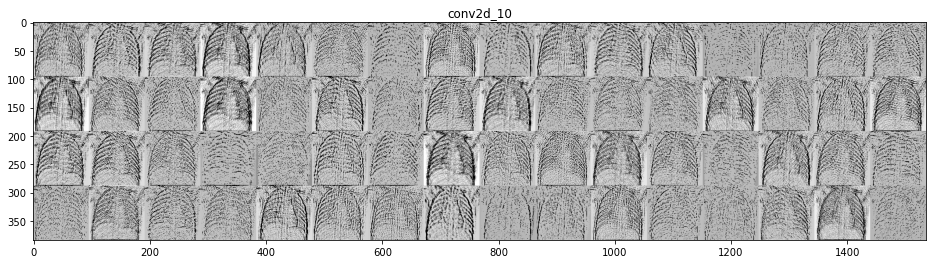

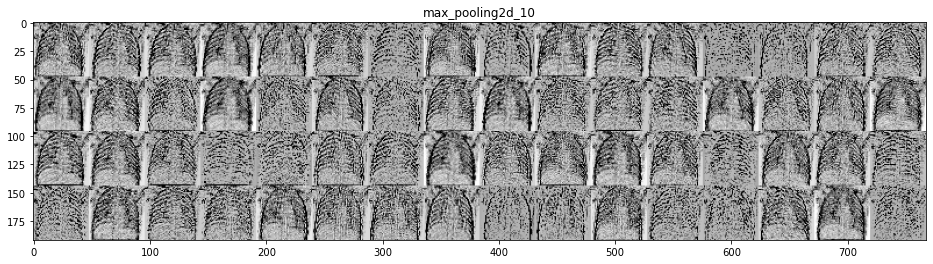

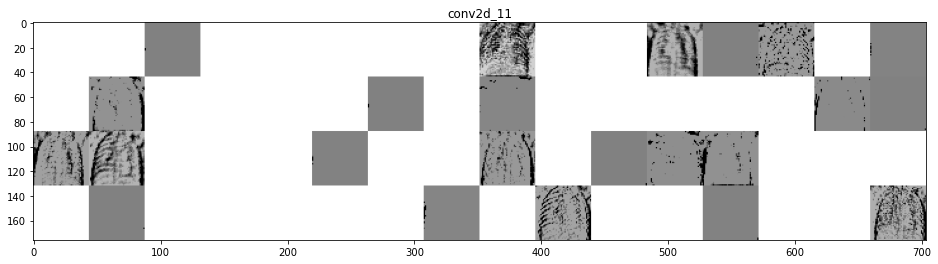

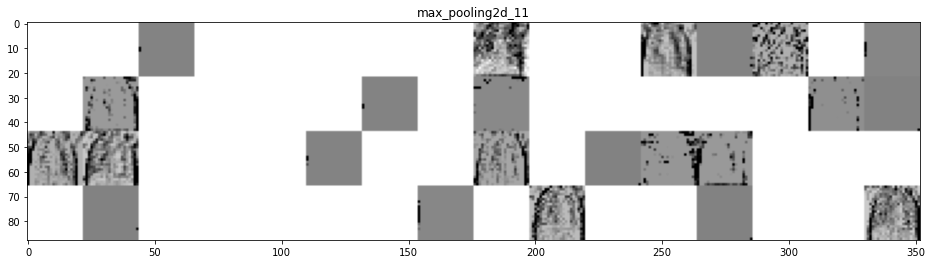

In [282]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model4.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();

## Sharpen Model - Conv & Maxpooling Layer Filters

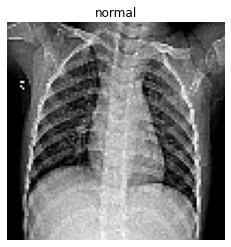

In [283]:
imge = sharpentest[j]
img_tensor = np.expand_dims(imge, axis=0)

plt.imshow(imge);
plt.axis('off');
plt.title(class_names[testLabels[j]], fontsize=12);
plt.show();

In [284]:
# Extracts the outputs of the all the layers
M5layer_outputs = [layer.output for layer in model5.layers]
# Creates a model that will return these outputs, given the model input:
M5activation_model = models.Model(inputs=model5.input, outputs=M5layer_outputs)

M5layer_names = []
for layer in model5.layers:
    M5layer_names.append(layer.name)
    
M5layer_names

['conv2d_12',
 'max_pooling2d_12',
 'conv2d_13',
 'max_pooling2d_13',
 'flatten_6',
 'dense_12',
 'dense_13']

In [285]:
activations = M5activation_model.predict(img_tensor)
len(activations)

7

C:\Users\alxra\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


MemoryError: Unable to allocate 216. TiB for an array with shape (59969536, 495616) and data type float64

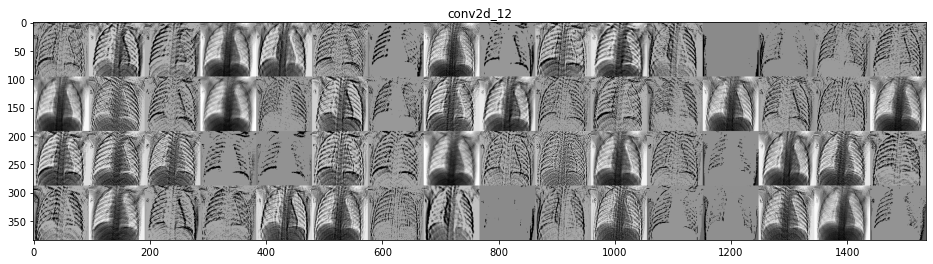

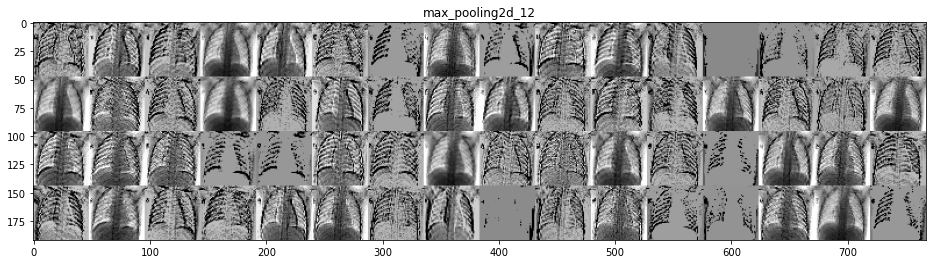

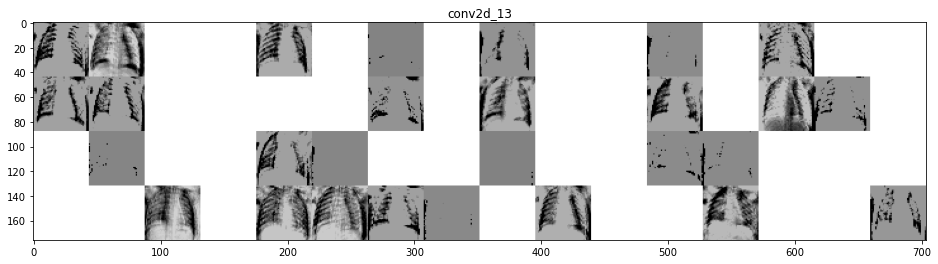

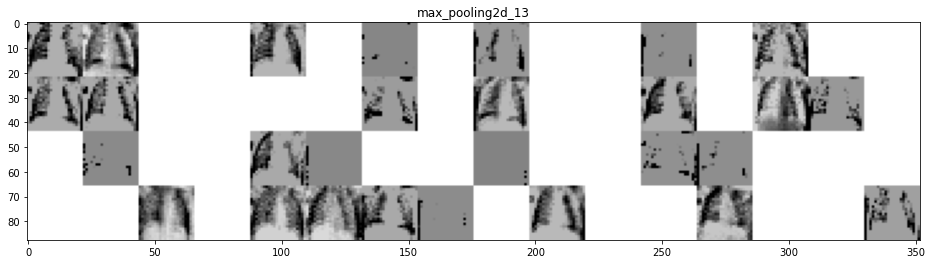

In [286]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model5.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();

## 20% Dropout Model - Conv & Maxpooling Layer Filters

In [287]:
# Extracts the outputs of the all the layers
M6layer_outputs = [layer.output for layer in model6.layers]
# Creates a model that will return these outputs, given the model input:
M6activation_model = models.Model(inputs=model6.input, outputs=M6layer_outputs)

M6layer_names = []
for layer in model6.layers:
    M6layer_names.append(layer.name)
    
M6layer_names

['conv2d_14',
 'max_pooling2d_14',
 'dropout',
 'conv2d_15',
 'max_pooling2d_15',
 'dropout_1',
 'flatten_7',
 'dense_14',
 'dense_15']

In [288]:
activations = M6activation_model.predict(img_tensor)
len(activations)

9

C:\Users\alxra\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


MemoryError: Unable to allocate 216. TiB for an array with shape (59969536, 495616) and data type float64

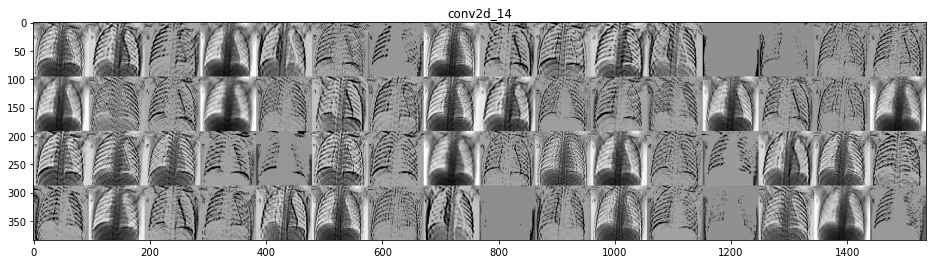

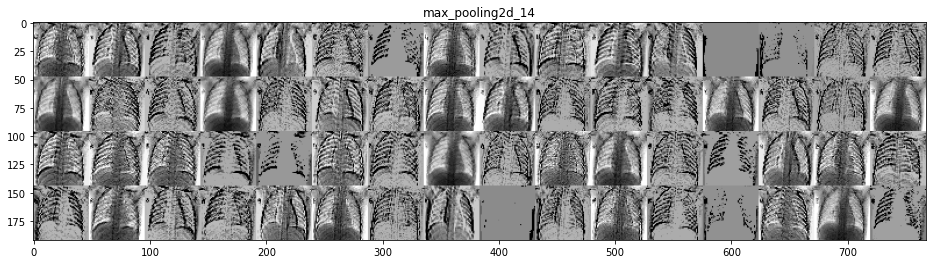

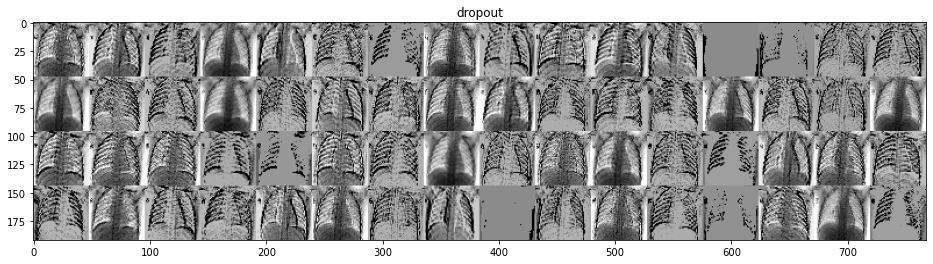

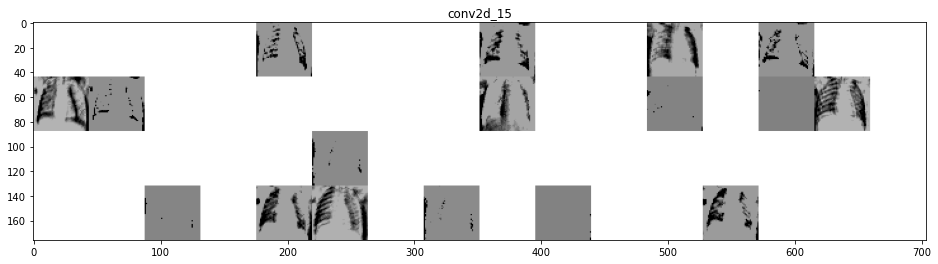

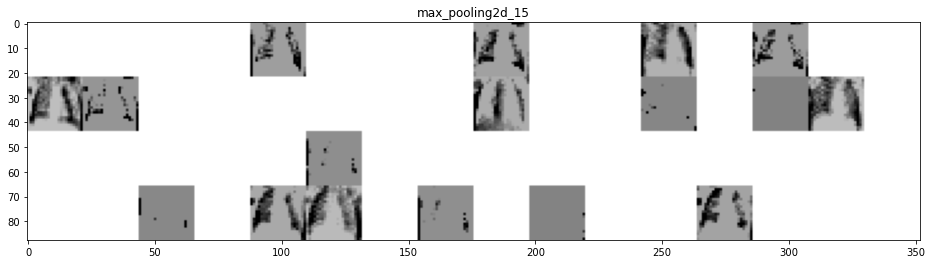

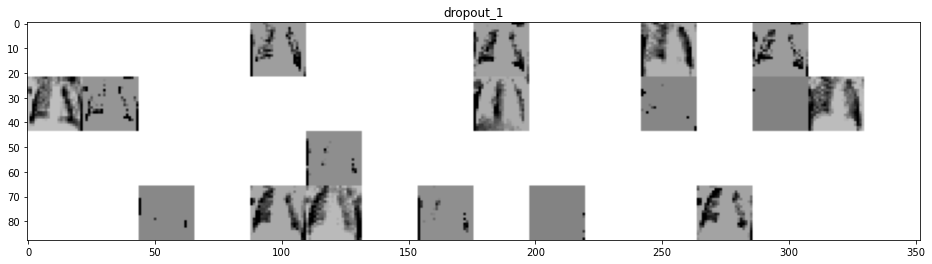

In [289]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model6.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();

## 50% Dropout Model - Conv & Maxpooling Layer Filters

In [290]:
# Extracts the outputs of the all the layers
M7layer_outputs = [layer.output for layer in model7.layers]
# Creates a model that will return these outputs, given the model input:
M7activation_model = models.Model(inputs=model7.input, outputs=M7layer_outputs)

M7layer_names = []
for layer in model7.layers:
    M7layer_names.append(layer.name)
    
M7layer_names

['conv2d_16',
 'max_pooling2d_16',
 'dropout_2',
 'conv2d_17',
 'max_pooling2d_17',
 'dropout_3',
 'flatten_8',
 'dense_16',
 'dense_17']

In [291]:
activations = M7activation_model.predict(img_tensor)
len(activations)

9

C:\Users\alxra\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


MemoryError: Unable to allocate 216. TiB for an array with shape (59969536, 495616) and data type float64

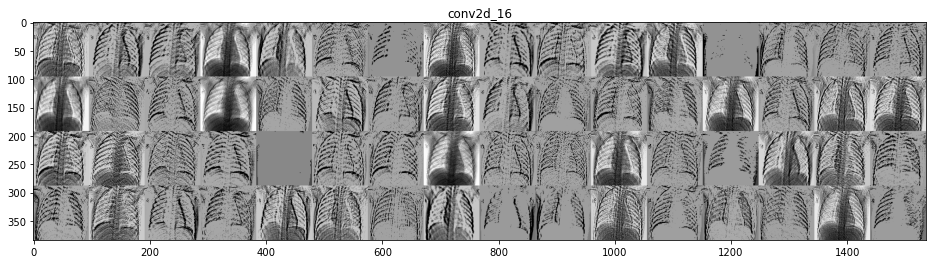

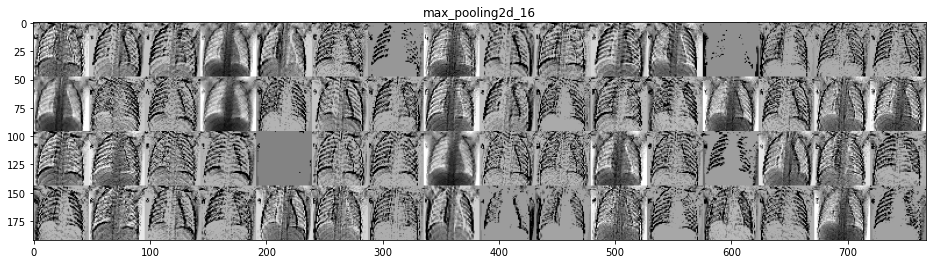

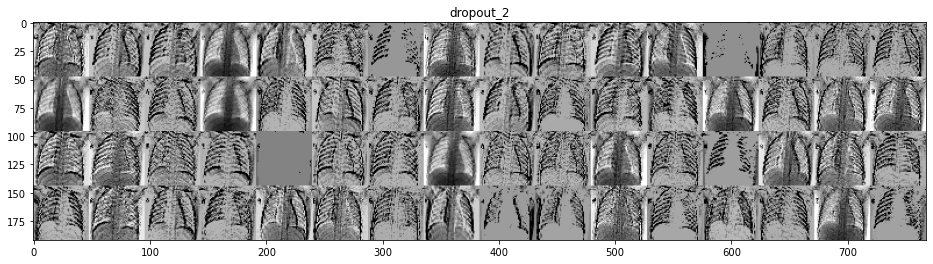

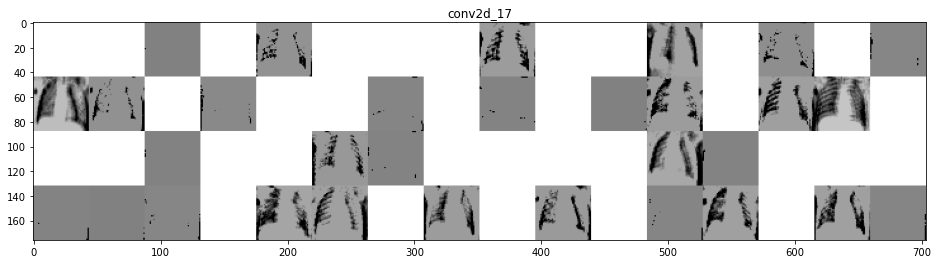

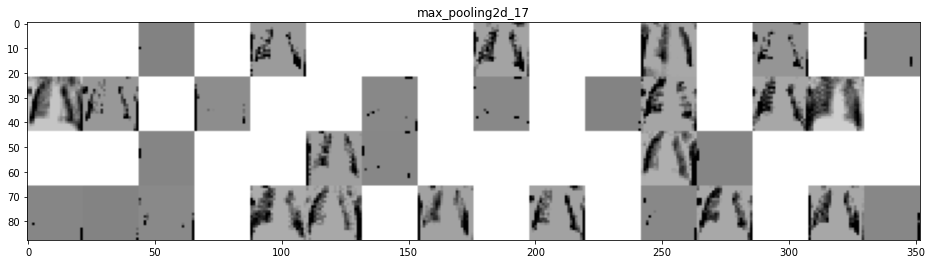

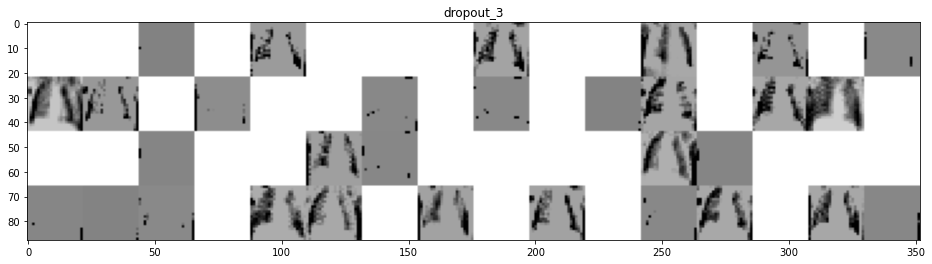

In [292]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model7.layers:
    layer_names.append(layer.name)
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='binary')
    
plt.show();